<a href="https://colab.research.google.com/github/skozh/MM/blob/main/Task1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Shyju Kozhisseri<br/>ID: 309572<br/>Group: J41323c

## Import Data

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
from statsmodels.graphics.gofplots import qqplot, ProbPlot
from scipy.stats import kstest, chisquare, cramervonmises
import warnings
from scipy.stats import gamma
from reliability.Fitters import Fit_Everything
from reliability.Distributions import Weibull_Distribution
from reliability.Other_functions import make_right_censored_data

warnings.filterwarnings("ignore",category=UserWarning)
warnings.filterwarnings("ignore",category=RuntimeWarning)
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [ ]:
input = pd.read_csv('garments_worker_productivity.csv')

In [ ]:
input.head()

,date,quarter,department,day,...,idle_men,no_of_style_change,no_of_workers,actual_productivity
0,1/1/2015,Quarter1,sweing,Thursday,...,0,0,59,0.940725
1,1/1/2015,Quarter1,finishing,Thursday,...,0,0,8,0.8865
2,1/1/2015,Quarter1,sweing,Thursday,...,0,0,30.5,0.80057
3,1/1/2015,Quarter1,sweing,Thursday,...,0,0,30.5,0.80057
4,1/1/2015,Quarter1,sweing,Thursday,...,0,0,56,0.800382


In [ ]:
input.describe()

,team,targeted_productivity,smv,wip,...,idle_men,no_of_style_change,no_of_workers,actual_productivity
count,1197,1197,1197,691,...,1197,1197,1197,1197
mean,6.4269,0.729632,15.0622,1190.47,...,0.369256,0.150376,34.6099,0.735091
std,3.46396,0.097891,10.9432,1837.46,...,3.26899,0.427848,22.1977,0.174488
min,1,0.07,2.9,7,...,0,0,2,0.233705
25%,3,0.7,3.94,774.5,...,0,0,9,0.650307
50%,6,0.75,15.26,1039,...,0,0,34,0.773333
75%,9,0.8,24.26,1252.5,...,0,0,57,0.850253
max,12,0.8,54.56,23122,...,45,2,89,1.12044


In [ ]:
input.isna().sum()

date                       0
quarter                    0
department                 0
day                        0
team                       0
targeted_productivity      0
smv                        0
wip                      506
over_time                  0
incentive                  0
idle_time                  0
idle_men                   0
no_of_style_change         0
no_of_workers              0
actual_productivity        0
dtype: int64

In [ ]:
sub_sample = input[['smv', 'no_of_workers', 'wip']]
sub_sample

,smv,no_of_workers,wip
0,26.16,59,1108
1,3.94,8,NaN
2,11.41,30.5,968
3,11.41,30.5,968
4,25.9,56,1170
...,...,...,...
1192,2.9,8,NaN
1193,3.9,8,NaN
1194,3.9,8,NaN
1195,2.9,15,NaN


In [ ]:
sub_sample = sub_sample.fillna(sub_sample.mean())
sub_sample.head()

,smv,no_of_workers,wip
0,26.16,59,1108
1,3.94,8,1190.47
2,11.41,30.5,968
3,11.41,30.5,968
4,25.9,56,1170


In [ ]:
sub_sample['wip'] = sub_sample['wip']/1000
#sub_sample  = (sub_sample-sub_sample.min()+0.01)/(sub_sample.max()-sub_sample.min())

In [ ]:
sub_sample.describe()

,smv,no_of_workers,wip
count,1197,1197,1197
mean,15.0622,34.6099,1.19047
std,10.9432,22.1977,1.39565
min,2.9,2,0.007
25%,3.94,9,0.97
50%,15.26,34,1.19047
75%,24.26,57,1.19047
max,54.56,89,23.122


## Histogram Plot and Kernel Density Estimate

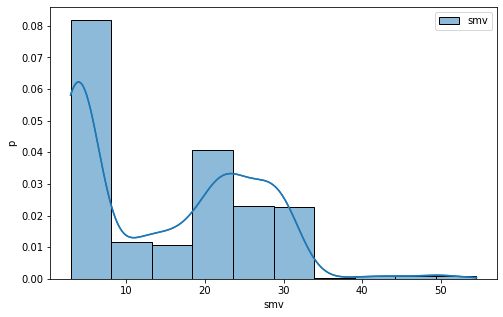

In [ ]:
plt.figure(figsize=(8, 5))

kernel = stats.gaussian_kde(sub_sample['smv'])

min_amount, max_amount = sub_sample['smv'].min(), sub_sample['smv'].max()
x = np.linspace(min_amount, max_amount, len(sub_sample))
kde_values = kernel(x)

sns.histplot(sub_sample['smv'], kde=True, stat='density', label=f'smv', bins=10)
plt.plot(x, kde_values)
plt.ylabel('p')
plt.xlabel('smv')
plt.legend()
plt.show()

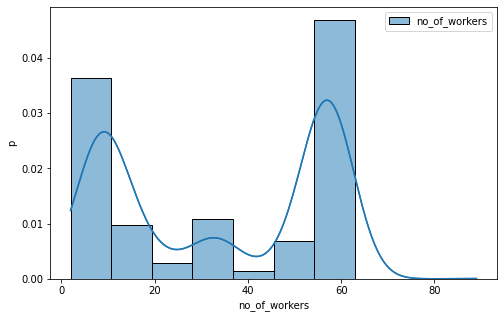

In [ ]:
plt.figure(figsize=(8, 5))

kernel = stats.gaussian_kde(sub_sample['no_of_workers'])

min_amount, max_amount = sub_sample['no_of_workers'].min(), sub_sample['no_of_workers'].max()
x = np.linspace(min_amount, max_amount, len(sub_sample))
kde_values = kernel(x)

sns.histplot(sub_sample['no_of_workers'], kde=True, stat='density', label=f'no_of_workers', bins=10)
plt.plot(x, kde_values)
plt.ylabel('p')
plt.xlabel('no_of_workers')
plt.legend()
plt.show()

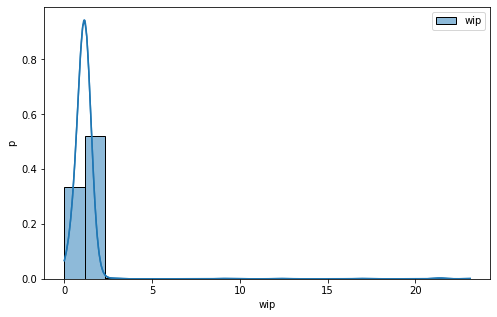

In [ ]:
plt.figure(figsize=(8, 5))

kernel = stats.gaussian_kde(sub_sample['wip'])

min_amount, max_amount = sub_sample['wip'].min(), sub_sample['wip'].max()
x = np.linspace(min_amount, max_amount, len(sub_sample))
kde_values = kernel(x)

sns.histplot(sub_sample['wip'], kde=True, stat='density', label=f'wip', bins=20)
plt.plot(x, kde_values)
plt.ylabel('p')
plt.xlabel('wip')
plt.legend()
plt.show()

## Box with whiskers Plot 

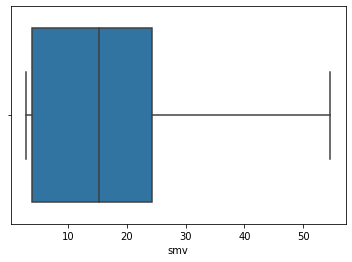

In [ ]:
ax = sns.boxplot(x=sub_sample['smv'])
plt.rcParams['figure.figsize'] = [10, 2] 

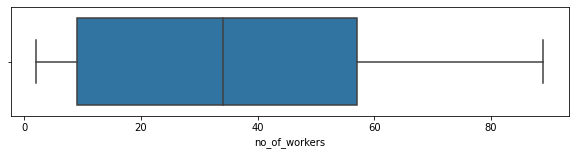

In [ ]:
ax = sns.boxplot(x=sub_sample['no_of_workers'])
plt.rcParams['figure.figsize'] = [10, 2] 

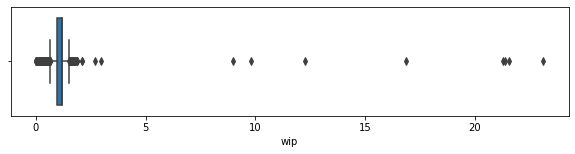

In [ ]:
ax = sns.boxplot(x=sub_sample['wip'])
plt.rcParams['figure.figsize'] = [10, 2] 

## Parametric Estimation

In [ ]:
sample_mean = sub_sample.mean()
sample_mean

smv             15.0622
no_of_workers   34.6099
wip             1.19047
dtype: float64

In [ ]:
sample_var = sub_sample.var()
sample_var

smv             119.754
no_of_workers   492.737
wip             1.94783
dtype: float64

In [ ]:
sample_std = sub_sample.std()
sample_std

smv             10.9432
no_of_workers   22.1977
wip             1.39565
dtype: float64

In [ ]:
alpha = sample_mean ** 2 / sample_var
beta = sample_var / sample_mean

alpha, beta

(smv              1.89446
 no_of_workers      2.431
 wip             0.727583
 dtype: float64,
 smv             7.95065
 no_of_workers   14.2369
 wip             1.63619
 dtype: float64)

### Maximum Likelihood Estimation

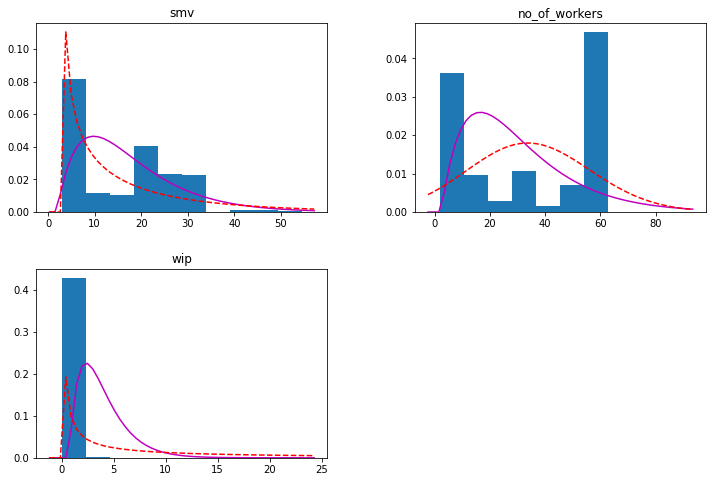

In [ ]:
alpha_mle = np.zeros((3,))
beta_mle = np.zeros((3,))
a_mle = np.zeros((3,))

axs = sub_sample.hist(density=True, figsize=(12, 8), sharex=False, sharey=False, bins=10, grid=False)

for index, ax in enumerate(axs.ravel()[:-1,]):
    m = ax.get_title()
    a_mle[index], alpha_mle[index], beta_mle[index] = stats.gamma.fit(sub_sample[m])
    

    x = np.linspace(*ax.get_xlim())
    ax.plot(x, gamma.pdf(x, 1.99, alpha[m], beta[m]), 'm-')
    ax.plot(x, gamma.pdf(x, a_mle[index], alpha_mle[index], beta_mle[index]) , 'r--')


### Least Squares

In [ ]:
def fn_least_sq(df, iter=100):

    x = np.linspace(df.min(), df.max(), len(df))
    y = df

    mean_x = np.mean(x)
    mean_y = np.mean(y)

    numer = 0
    denom = 0
    for i in range(iter):
        numer += (x[i] - mean_x) * (y[i] - mean_y)
        denom += (x[i] - mean_x) ** 2

    m = numer / denom
    c = mean_y - (m * mean_x)
    return m, c

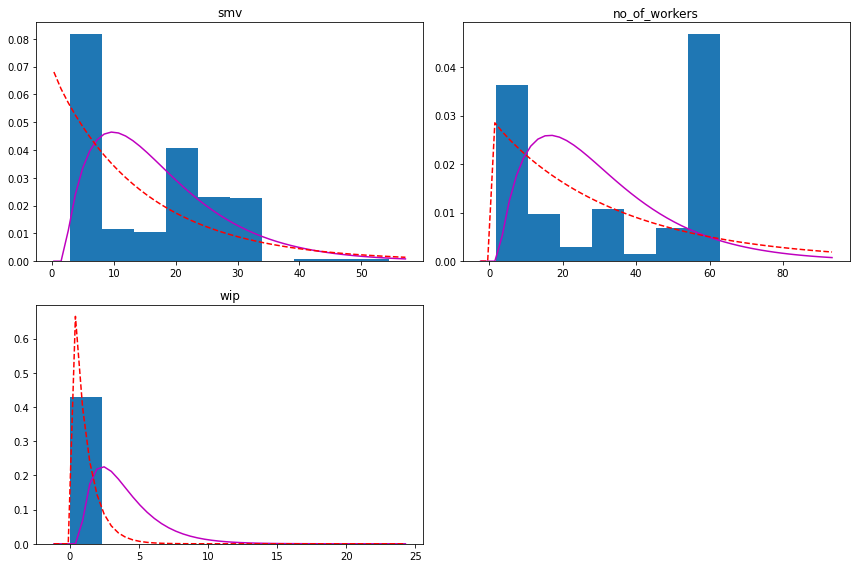

In [ ]:
alpha_ls = np.zeros((3,))
beta_ls = np.zeros((3,))

axs = sub_sample.hist(density=True, figsize=(12, 8), sharex=False, sharey=False, bins=10, grid=False)
for index, ax in enumerate(axs.ravel()[:-1,]):

    m = ax.get_title()
    x = np.linspace(*ax.get_xlim())
    alpha_ls[index], beta_ls[index] = fn_least_sq(sub_sample[m])

    
    ax.plot(x, gamma.pdf(x, 1.99, alpha[m], beta[m]), 'm-')
    ax.plot(x, gamma.pdf(x, 0.99, alpha_ls[index], beta_ls[index]), 'r--')

        
plt.tight_layout()

## Mix Distribution

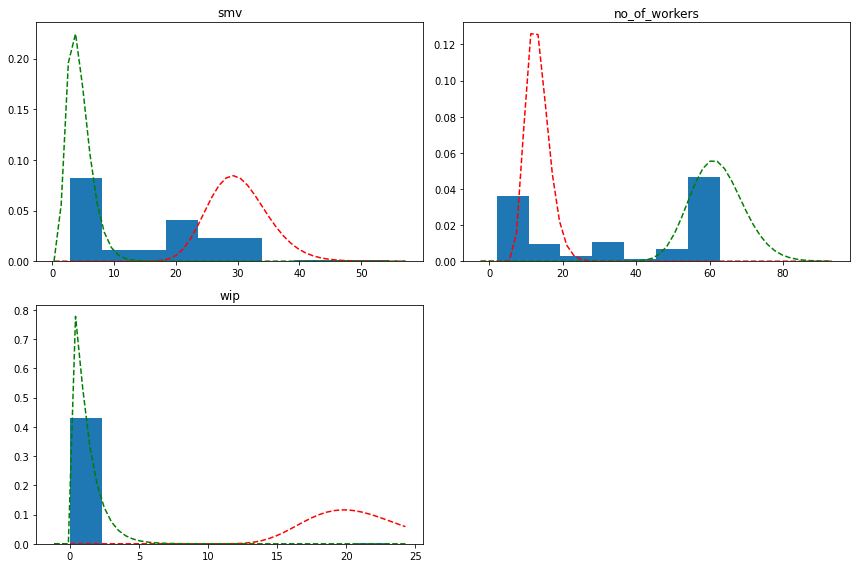

In [ ]:
from sklearn.mixture import GaussianMixture
alpha_new = np.zeros((3,2))
beta_new = np.zeros((3,2))

axs = sub_sample.hist(density=True, figsize=(12, 8), sharex=False, sharey=False, bins=10, grid=False)
sub_sample_div = np.zeros((3, 2, len(sub_sample)))

for index, ax in enumerate(axs.ravel()[:-1,]):
    
    # Get variable
    m = ax.get_title()
    
    # Plot fitted distribution
    x = np.linspace(*ax.get_xlim())

    gmm = GaussianMixture(2, random_state=0).fit(sub_sample[m].values.reshape(-1, 1))
        
    loc = gmm.means_
    scale = np.sqrt(gmm.covariances_)

    sub_sample_div[index][0] = sub_sample[m].values
    sub_sample_div[index][1] = gmm.predict(sub_sample[m].values.reshape(-1, 1))

    alpha_new[index] = [loc[0][0], loc[1][0]]
    beta_new[index] = [scale[0][0][0], scale[1][0][0]]

    ax.plot(x, gamma.pdf(x, alpha_new[index][1], beta_new[index][1]), 'r--')
    ax.plot(x, gamma.pdf(x, alpha_new[index][0], beta_new[index][0]), 'g--')
    
plt.tight_layout()

## Best Fit Models


Variable:  smv
Results from Fit_Everything:
Analysis method: MLE
Failures / Right censored: 1197/0 (0% right censored) 

  Distribution   Alpha     Beta   Gamma      Mu    Sigma    Lambda  Log-likelihood    AICc     BIC      AD
      Gamma_3P 29.0659 0.418438  2.8999                                   -3739.45 7484.92 7500.16 88.8942
    Weibull_3P 9.13369 0.561611  2.8999                                   -3866.33 7738.68 7753.93 94.5617
Loglogistic_3P 5.05373  0.65791  2.8999                                   -4124.98 8255.98 8271.22 105.178
Exponential_2P                   2.8999                  0.0822215        -4187.51 8379.03  8389.2 206.559
  Lognormal_3P                  2.76988 1.62269  1.70586                  -4280.12 8566.26 8581.51 79.2747
    Weibull_2P 16.4113  1.33731                                           -4376.13 8756.27 8766.44 78.0612
      Gamma_2P 9.68584  1.55507                                           -4381.27 8766.54 8776.71  79.551
  Lognormal_2P        

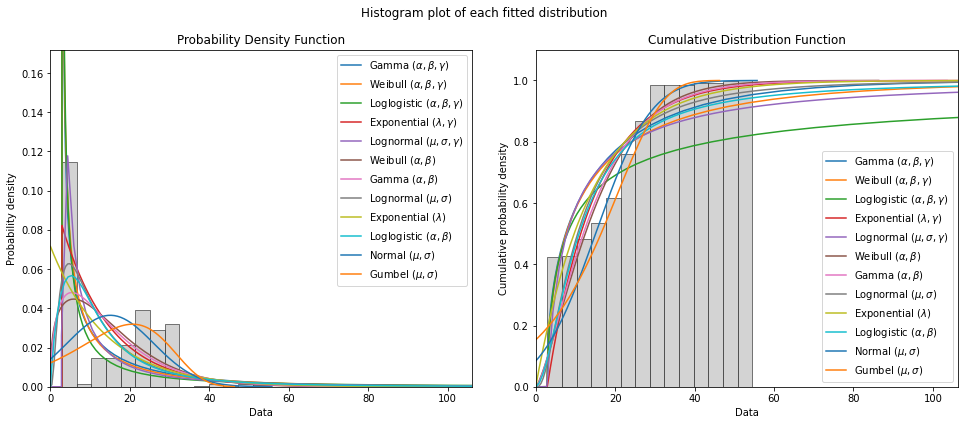

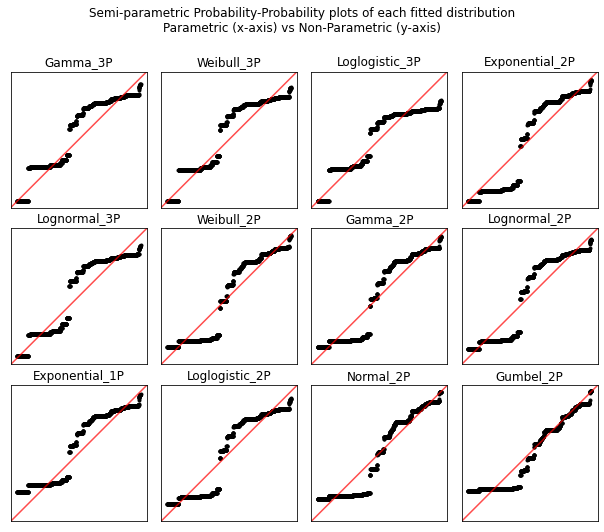

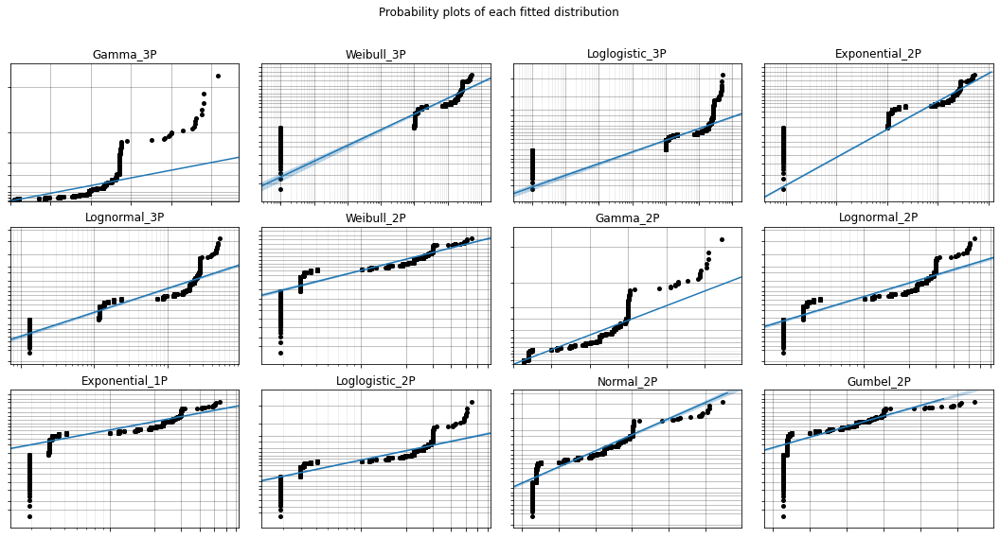

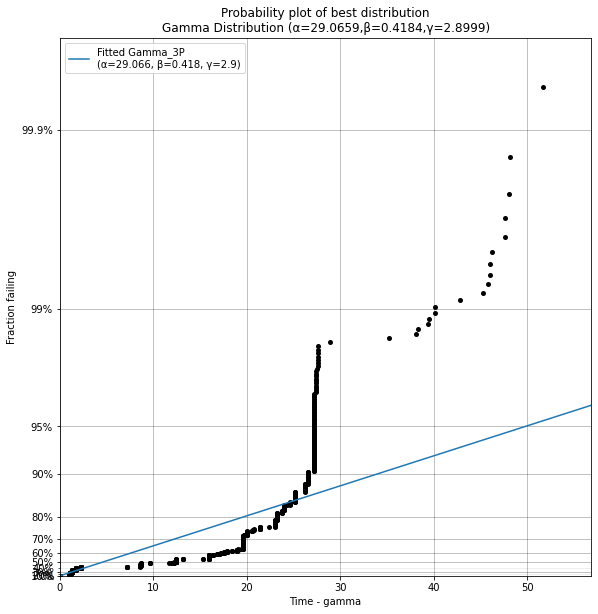

Best fit model for  smv is:  Gamma_3P 
Parameters: [29.06594921  0.41843787  2.8999    ]

Variable:  no_of_workers
Results from Fit_Everything:
Analysis method: MLE
Failures / Right censored: 1197/0 (0% right censored) 

  Distribution   Alpha    Beta    Gamma      Mu    Sigma    Lambda  Log-likelihood    AICc     BIC      AD
    Weibull_3P 35.5552 1.34523  1.83435                                   -5309.02 10624.1 10639.3 114.525
    Weibull_2P 38.2591 1.49992                                            -5321.35 10646.7 10656.9 116.225
      Gamma_3P 22.6835  1.4448  1.83672                                   -5329.51   10665 10680.3 106.359
      Gamma_2P 19.8294 1.74538                                            -5344.83 10693.7 10703.8 109.197
Exponential_2P                   1.9999                  0.0306655        -5368.09 10740.2 10750.3 93.5168
     Gumbel_2P                          45.4633  18.3974                  -5389.08 10782.2 10792.3 112.235
  Lognormal_2P                

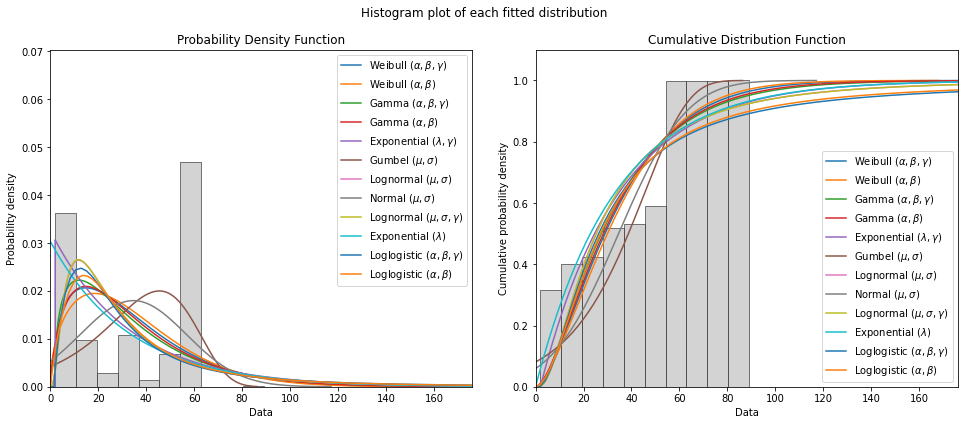

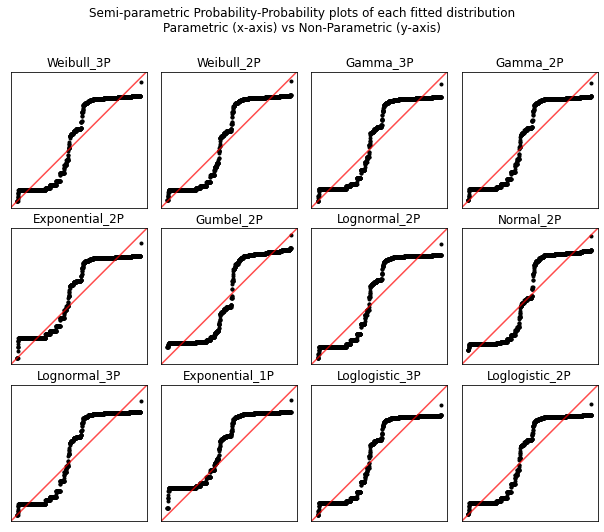

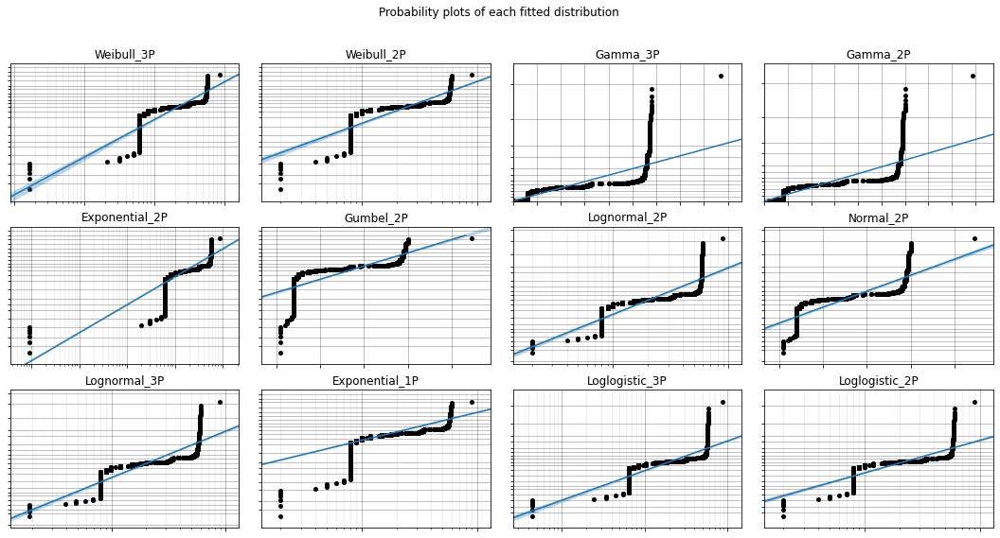

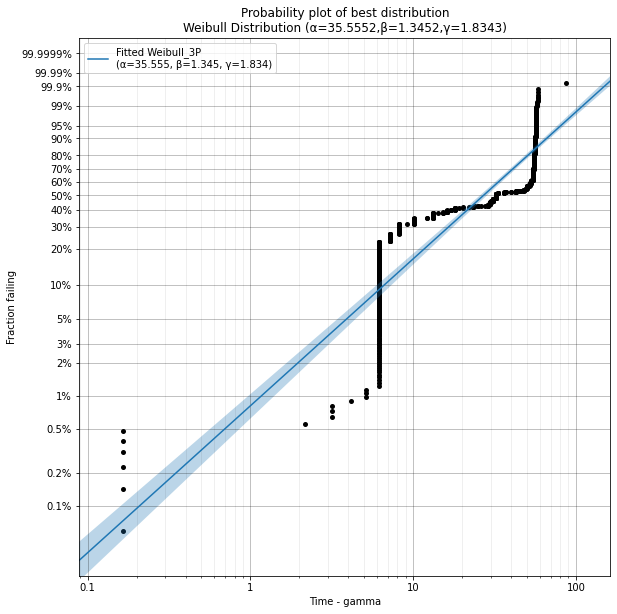

Best fit model for  no_of_workers is:  Weibull_3P 
Parameters: [35.55519409  1.34522538  1.83434955]

Variable:  wip
Results from Fit_Everything:
Analysis method: MLE
Failures / Right censored: 1197/0 (0% right censored) 

  Distribution    Alpha    Beta  Gamma       Mu    Sigma   Lambda  Log-likelihood    AICc     BIC      AD
Loglogistic_2P  1.09442 5.13659                                          -604.438 1212.89 1223.05 90.8195
Loglogistic_3P  1.09442 5.13659      0                                   -604.438  1214.9 1230.14 90.8195
      Gamma_2P 0.336612 3.53662                                          -1030.13 2064.27 2074.43     NaN
      Gamma_3P 0.336612 3.53662      0                                   -1030.13 2066.28 2081.52     NaN
  Lognormal_2P                         0.026371 0.559941                 -1035.81 2075.63  2085.8 152.457
  Lognormal_3P                       0 0.026371 0.559941                 -1035.81 2077.65 2092.89 152.457
    Weibull_2P  1.31687  1.3614    

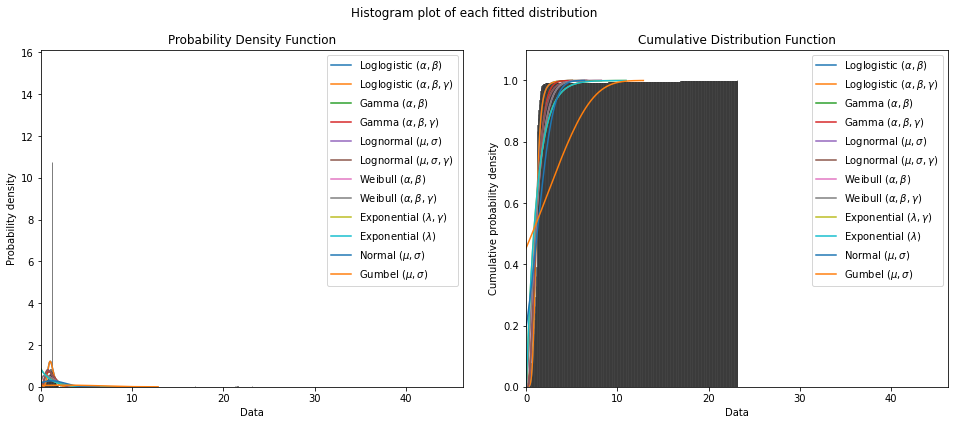

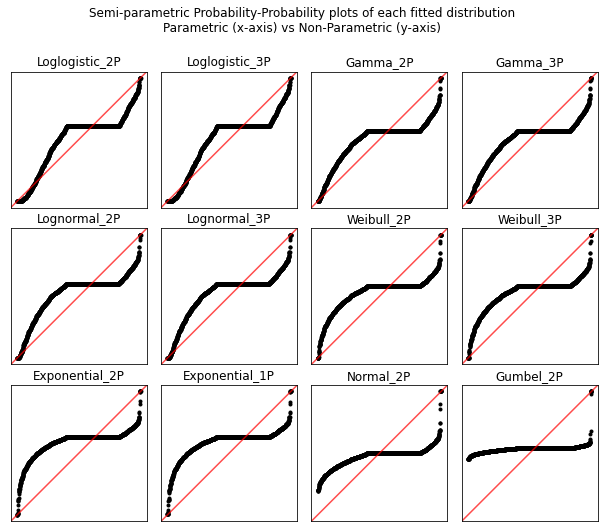

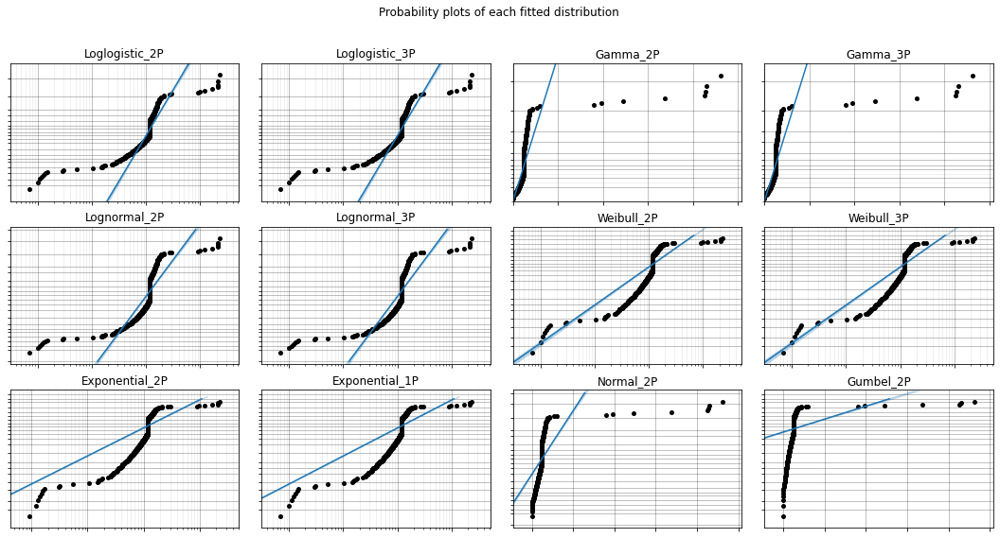

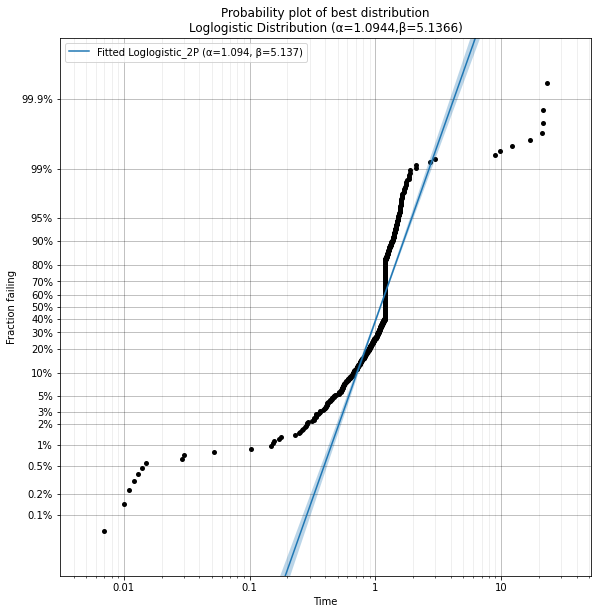

Best fit model for  wip is:  Loglogistic_2P 
Parameters: [1.09441799 5.13658661 0.        ]


In [ ]:
for column in sub_sample.columns:
    print("\nVariable: ", column)
    results = Fit_Everything(failures=list(sub_sample[column])) 
    print('Best fit model for ', column,'is: ', results.best_distribution_name, '\nParameters:', results.best_distribution.parameters)


## Statistical Tests

In [ ]:
for index, column in enumerate(sub_sample.columns):
    mean0 = alpha_new[index][0]
    std0 = beta_new[index][0]

    mean1 = alpha_new[index][1]
    std1 = beta_new[index][1]
    
    data = sub_sample_div[index]

    x0 = np.sort(data[0][data[1, :]==0])
    x1 = np.sort(data[0][data[1, :]==1])

    print("\nKS Test")

    print(column, "1: ", kstest(x0, 'gamma', args=(mean0,std0), alternative='less', mode='auto'))
    print(column, "2: ", kstest(x1, 'gamma', args=(mean1,std1), alternative='less', mode='auto'))

    print("\nCramér-von Mises Test")

    print(column, "1: ", cramervonmises(x0, cdf='gamma', args=(mean0, std0)))
    print(column, "2: ", cramervonmises(x1, cdf='gamma', args=(mean1, std1)))



KS Test
smv 1:  KstestResult(statistic=0.23241836444383035, pvalue=8.08061136684818e-25)
smv 2:  KstestResult(statistic=0.013562679425787705, pvalue=0.7686012423825749)

Cramér-von Mises Test
smv 1:  CramerVonMisesResult(statistic=18.807763624355594, pvalue=4.540779863226874e-09)
smv 2:  CramerVonMisesResult(statistic=81.9850101990088, pvalue=1.5011085263694213e-08)

KS Test
no_of_workers 1:  KstestResult(statistic=0.0009124743543837965, pvalue=0.9982706293235174)
no_of_workers 2:  KstestResult(statistic=0.0032159452192961346, pvalue=0.9877217213833012)

Cramér-von Mises Test
no_of_workers 1:  CramerVonMisesResult(statistic=84.99724313480006, pvalue=2.5377520196379066e-08)
no_of_workers 2:  CramerVonMisesResult(statistic=63.96117589316602, pvalue=2.0299159575465353e-08)

KS Test
wip 1:  KstestResult(statistic=0.215130362609889, pvalue=5.323934748648015e-49)
wip 2:  KstestResult(statistic=0.0, pvalue=1.0)

Cramér-von Mises Test
wip 1:  CramerVonMisesResult(statistic=40.04280855606917, 

## QQ Plots

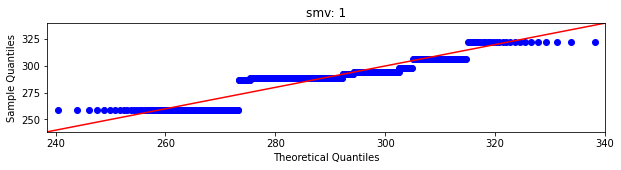

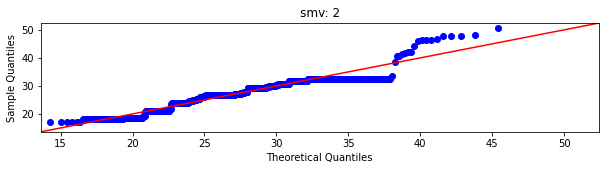

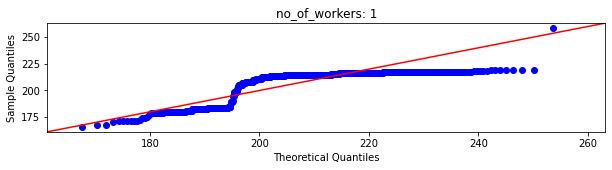

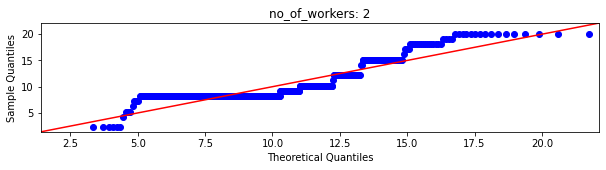

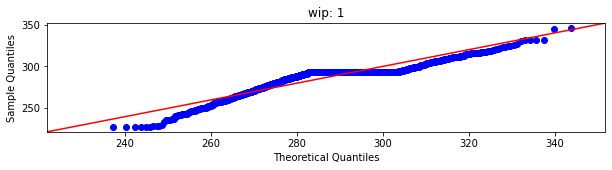

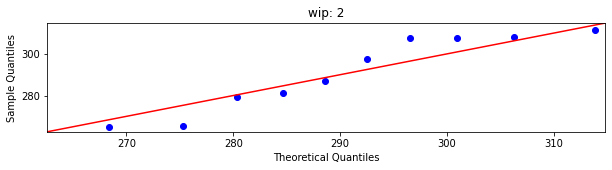

In [ ]:
for index, column in enumerate(sub_sample.columns):
    mean0 = alpha_new[index][0]
    std0 = beta_new[index][0]

    mean1 = alpha_new[index][1]
    std1 = beta_new[index][1]

    data = sub_sample_div[index]
    
    x0 = np.sort(data[0][data[1, :]==0])
    x1 = np.sort(data[0][data[1, :]==1])

    
    qqplot(x0, stats.gamma, fit=True, line='45')
    plt.title(column+": 1")
    qqplot(x1, stats.gamma, fit=True, line='45')
    plt.title(column+": 2")